*В названиях моделей встречаются разные паттерны имен, например, iPhone 12 / iPhone12. В идеале собрать все существующие варианты для каждой модели и сделать маппинг. Пока я решил проблему с помощью регулярок*

Данные для тестов брал с яндекс-диска HD-maps https://disk.yandex.kz/d/IkeotU88aB9tOQ

In [1]:
import os
import cv2
import json
from matplotlib import pyplot as plt
import re
import numpy as np
from functools import reduce
%matplotlib inline

In [2]:
class Remapper:
    def __init__(self, yml_path : str):
        remap = cv2.FileStorage(yml_path, cv2.FILE_STORAGE_READ)
        self.xmap = remap.getNode("XMap").mat()
        self.ymap = remap.getNode("YMap").mat()
    
    def remap(self, image):
        return cv2.remap(image, self.xmap, self.ymap, cv2.INTER_CUBIC)
    
    def get_roi_mask(self):
        blob = np.ones(self.xmap.shape)
        remapped = self.remap(blob)
        mask = (remapped == 0).astype(int)*255
        return mask
        
    @staticmethod   
    def check_roi_mask(mask):
        assert len(np.unique(mask)) == 2, "this mask is not binary"
        assert ((mask == 0).sum() + (mask == 255).sum() == reduce(lambda x,y: x*y, mask.shape)), "mask is not correct"
        

def get_camera_model(path_to_meta):
    with open(path_to_meta, "r") as f:
        data = f.read()
        json_acceptable_data = data.replace("'", "\"")
        data = json.loads(json_acceptable_data)
        match = re.match(r"([a-z]+)([0-9]+)", data['device'].lower(), re.I)
        model = "_".join(match.groups())
    return model
        


### Init paths to images, metainfo, mapper

In [3]:
path_to_imgs = "/home/anvar/datasets/remapper/imgs/"
path_to_meta = "/home/anvar/datasets/remapper/device.txt"
path_to_mapper = f"/home/anvar/datasets/remapper/{get_camera_model(path_to_meta)}.yml"

In [4]:
remapper = Remapper(path_to_mapper)
images = [cv2.imread(os.path.join(path_to_imgs, img_path)) for img_path in os.listdir(path_to_imgs)]

## Visualize

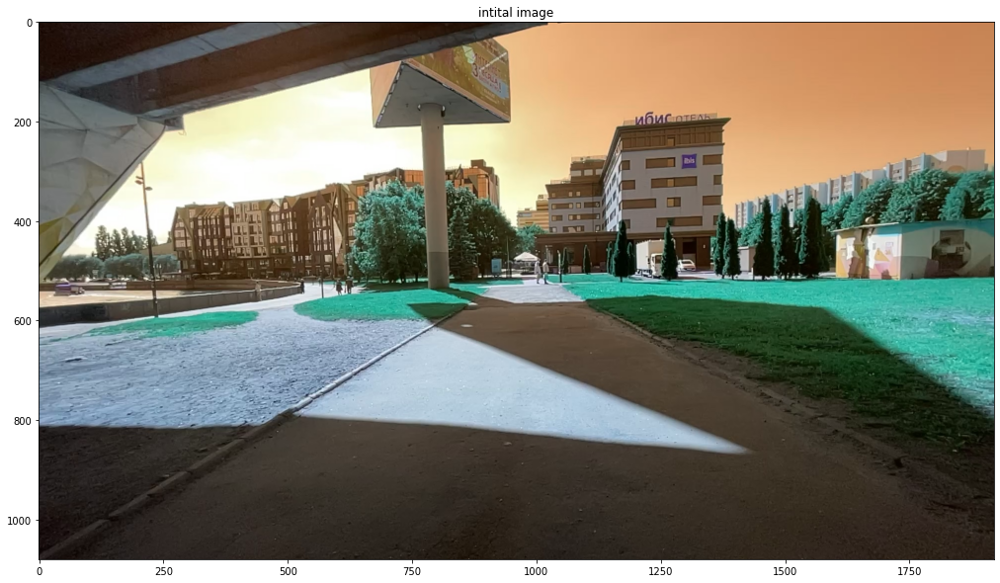

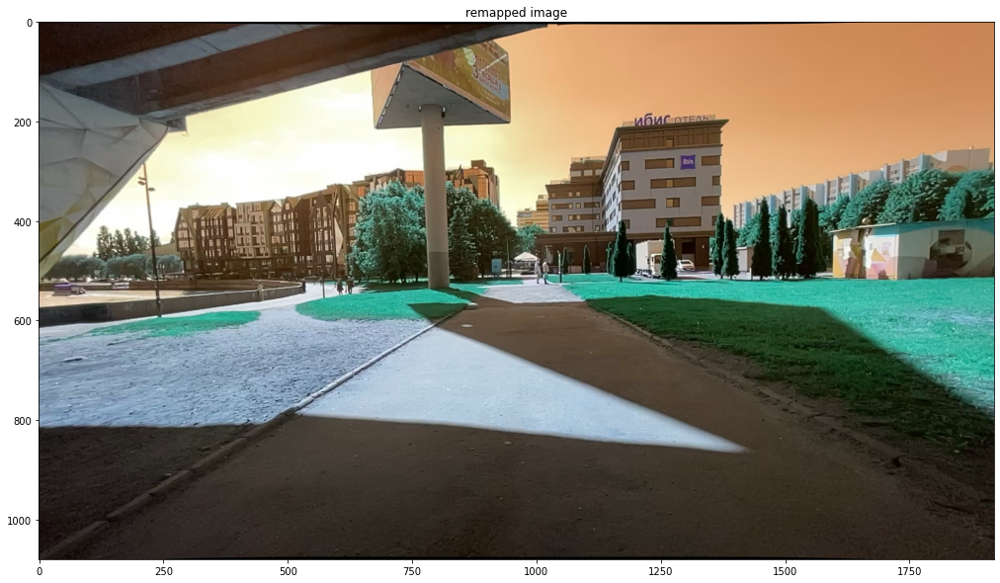

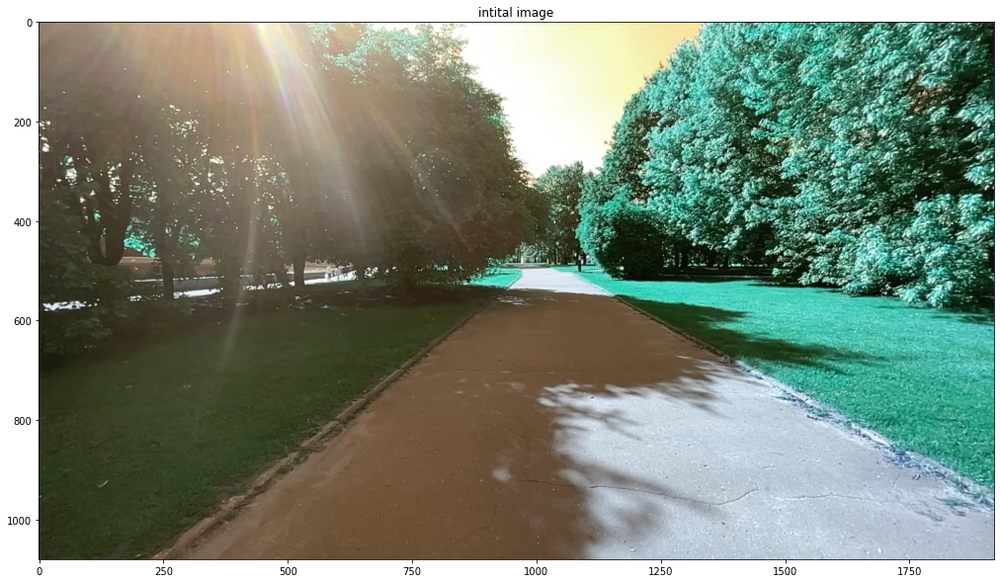

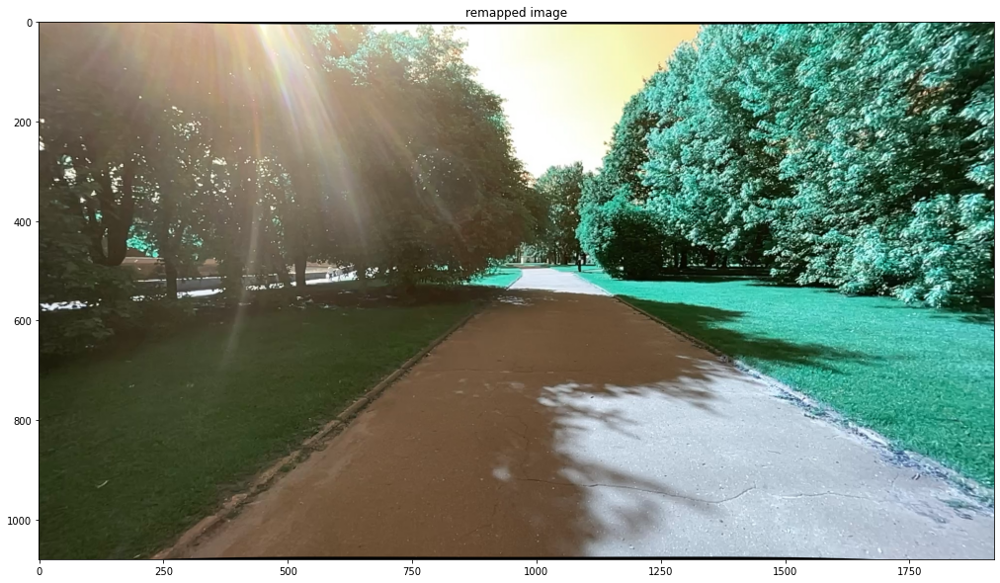

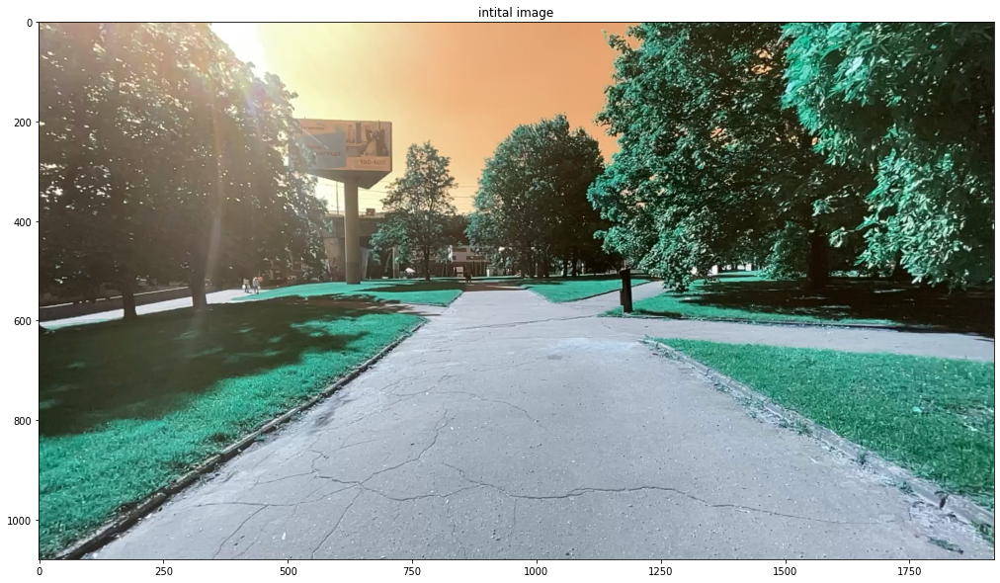

...

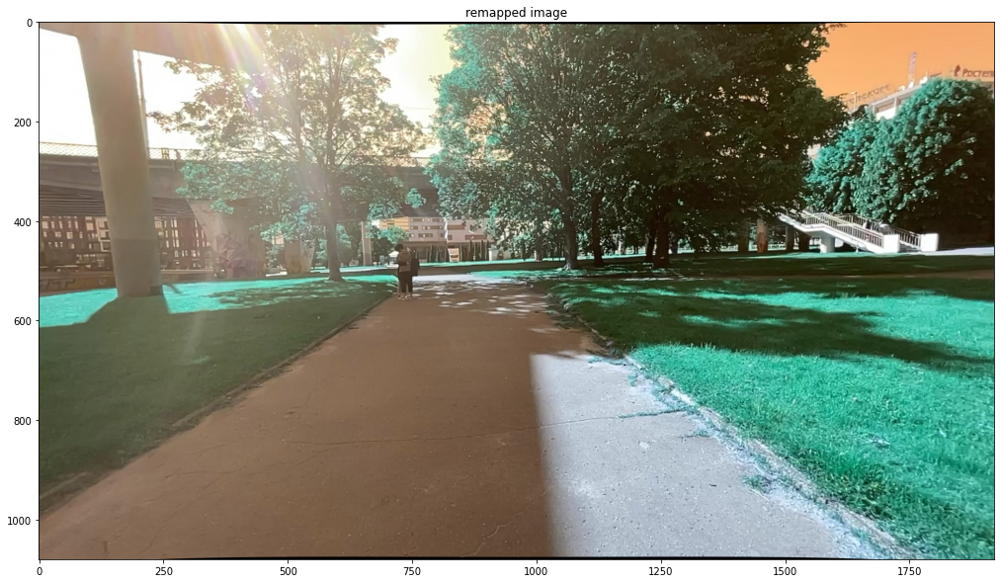

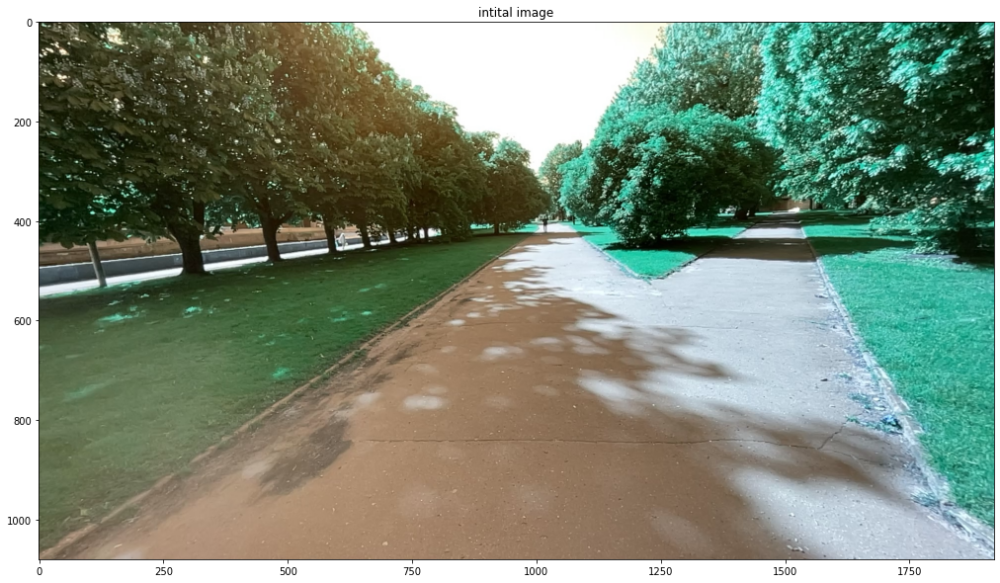

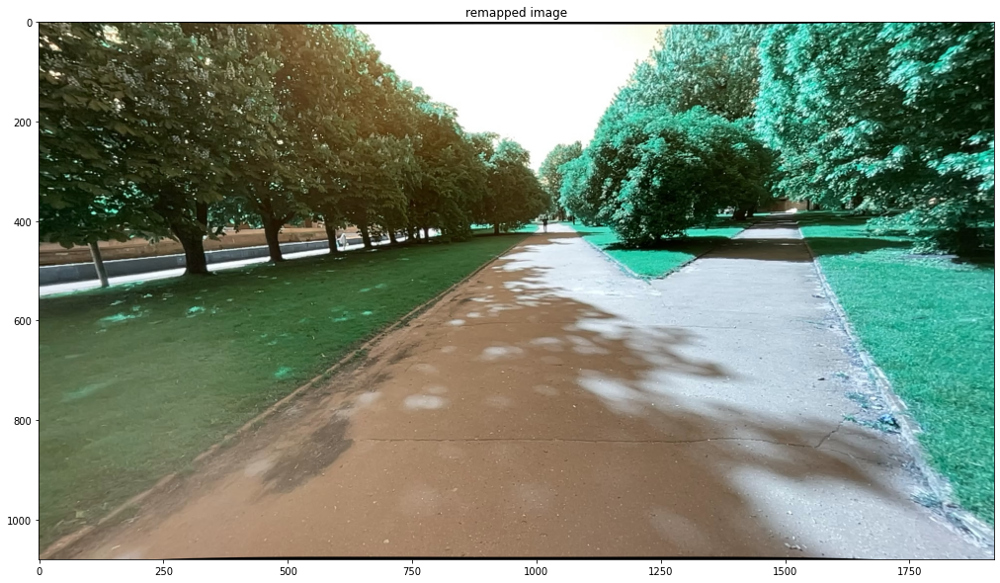

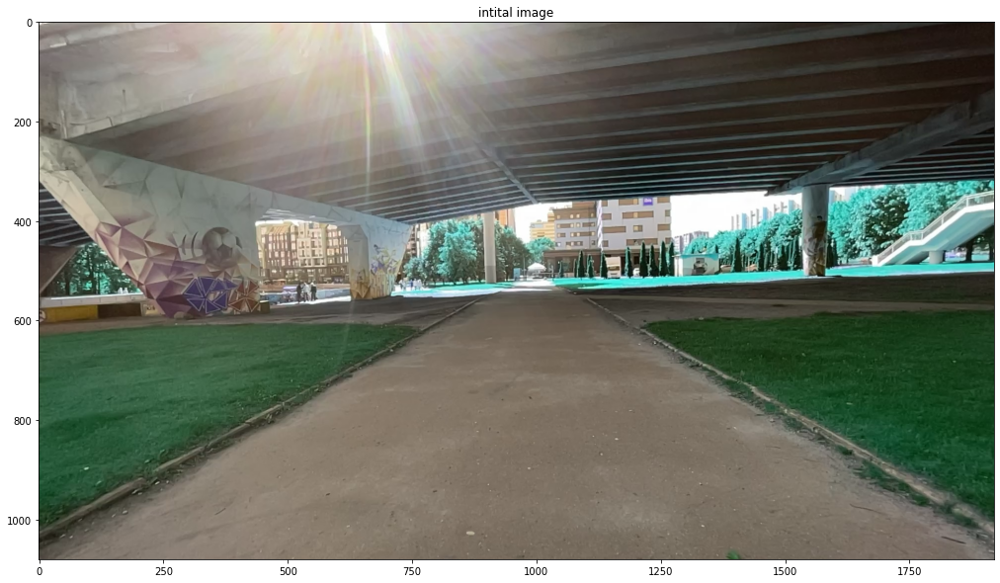

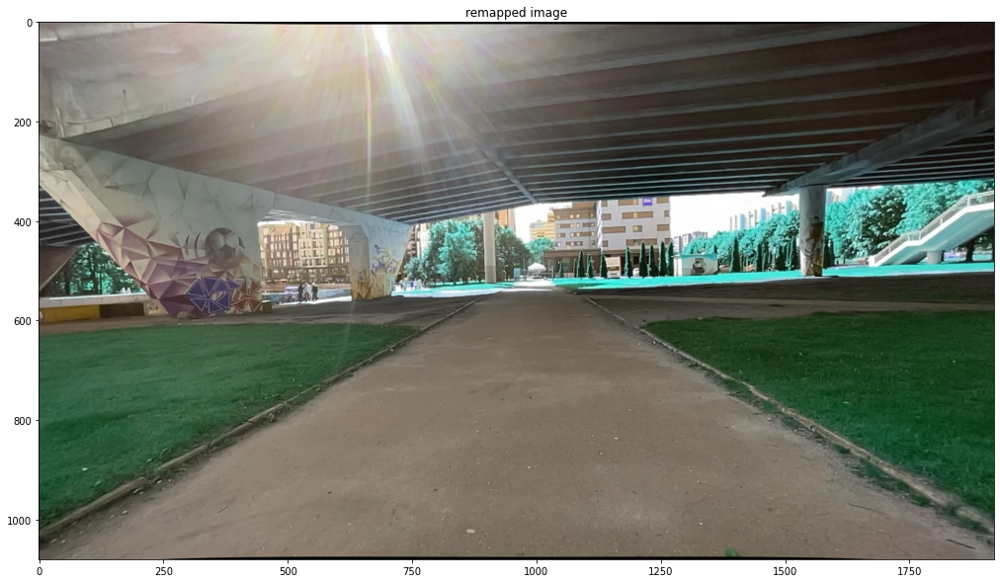

In [5]:
for num, img in enumerate(images):
    fig = plt.figure(figsize=(19, 10))
    r_img = remapper.remap(img)
    plt.title("intital image")
    plt.imshow(img)
    plt.show()
    fig = plt.figure(figsize=(19, 10))
    plt.title("remapped image")
    plt.imshow(r_img)
    plt.show()



###  Creating ROI mask

Эта маска зависит только от **модели камеры**, и не зависит от *входных изображений*. Для каждой модели камеры существует единственная маска, получить ее можно, например, как я сделал ниже. Это *бинарная* маска. Области, которые отсекаются имеют значение 255, остальные - 0.

PS для айфонов обычно маска почти вся черная, за исключением очень узких областей внизу и наверху картинки. Другие модели не проверял, так как для них пока нет маппингов. Маппинги можно достать у команды slam, либо у меня (Анвара).

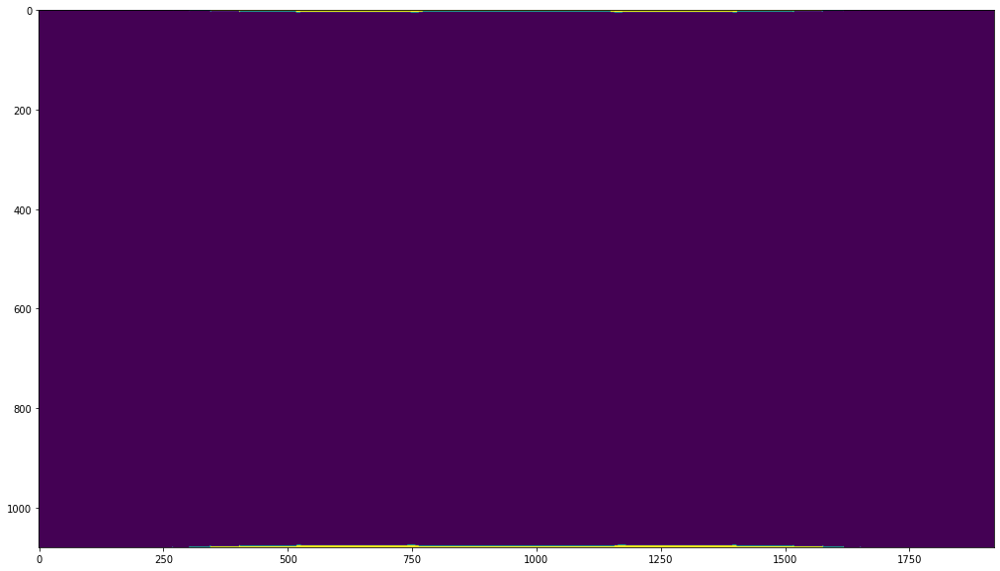

In [6]:
remapper = Remapper(path_to_mapper)
fig = plt.figure(figsize=(19, 10))
roi_mask = remapper.get_roi_mask()
remapper.check_roi_mask(roi_mask)
plt.imshow(roi_mask)

### check inference time (usualy about 5.8 ms on AMD Ryzen 7 5800H)

In [7]:
%%time
for i in range(1000):
    r_img = remapper.remap(img)

CPU times: user 1min 25s, sys: 1.58 s, total: 1min 27s
Wall time: 5.77 s
